<a href="https://colab.research.google.com/github/openssbd/hikarijuku/blob/master/ImageSeries.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

# HTTP library
import requests

# Stream of in-memory bytes
from io import BytesIO
# Pillow library
from PIL import Image
# OpenCV library
import cv2

from skimage.segmentation import active_contour

print (cv2.__version__)
# tested Python 2 or 3 + OpenCV v 3.2.0

3.4.3


# A simple SSBD wrapper API to access images

In [0]:
class ssbd_image_api(object):
  SSBD_BASE_URL = "http://ssbd.qbic.riken.jp/image/"
  imageApi = SSBD_BASE_URL+"webgateway/render_image/"
  metadataApi = SSBD_BASE_URL+"webclient/imgData/"
  fmt = "?format=json;"

  # getting an image from SSBD given a image id, z and t  
  def get_image(self, id, z, t):
    parameters = self.imageApi+str(id)+'/'+str(z)+'/'+str(t)
    print(parameters)
    resp = requests.get(parameters)
    if resp.status_code != 200:
      # This means something went wrong
      sys.exit()
    imgdata = cv2.cvtColor(np.array(Image.open(BytesIO(resp.content))), cv2.COLOR_RGB2GRAY)
    return imgdata
  
  def get_metadata(self, id):
    parameters = self.metadataApi+str(id)
    print(parameters)
    resp = requests.get(parameters)
    if resp.status_code != 200:
      # This means something went wrong
      sys.exit()
    metadata = resp.json()
    return metadata

In [3]:
ssbdimg = ssbd_image_api()
img = ssbdimg.get_image(33724, 0, 0)

http://ssbd.qbic.riken.jp/image/webgateway/render_image/33724/0/0


In [4]:
type(img)

numpy.ndarray

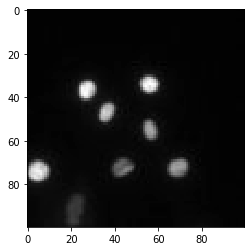

In [5]:
plt.imshow(img, 'gray')

In [6]:
metadata = ssbdimg.get_metadata(33724)

http://ssbd.qbic.riken.jp/image/webclient/imgData/33724


In [7]:
print ("ProjectName:", metadata['meta']['projectName'])
print ("Dataset:", metadata['meta']['datasetName'])
print ("X:", metadata['size']['width'])
print ("Y:", metadata['size']['height'])
print ("Z:", metadata['size']['z'])
print ("T:", metadata['size']['t'])
print ("C:", metadata['size']['c'])
print ("PixelsType: ", metadata['meta']['pixelsType'])
print ("PixwlRange: ", metadata['pixel_range'][1])

ProjectName: 17-Aoki-MolDyn
Dataset: sample1
X: 100
Y: 100
Z: 1
T: 391
C: 1
PixelsType:  uint16
PixwlRange:  65535


In [0]:
class imgSeries(object):
  num_labels = []
  labels = []
  stats = []
  centroids = []
  sizes = []
  areas = []
  total_intensity_lst = []
  img_metadata = None
  total_timept = 1

  def img_filtering(self, img):
    # get an image from SSBD only for testing
    # img = ssbdimg.get_image(img_id, z, t)
    # metadata = ssbdimg.get_metadata(img_id)
    
    # Filterd
    cv_img2 = cv2.GaussianBlur(img, (3,3), 0)
    #cv_img2 = cv2.medianBlur(cv_img1, 3)
    maxPixel = int(self.img_metadata['pixel_range'][1])
    threshold, cv_img3 = cv2.threshold(cv_img2, 0, maxPixel, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
    print ("maxPixel", maxPixel, "threshold", threshold)
    titles = ['Input image', "Gaussian Filtering", "Otsu's Binarization"]
    images = [img, cv_img2, cv_img3]
    plt.figure(figsize=(10,3))
    for i in range(0, 3):
      plt.subplot(1, 3, i+1)
      plt.imshow(images[i], 'gray')
      plt.title(titles[i])
      plt.xticks([]), plt.yticks([])
    retval, labels, stats, centroids = cv2.connectedComponentsWithStats(cv_img3)
    self.num_labels.append(retval)
    self.labels.append(labels)
    self.centroids.append(centroids)
    self.stats.append(stats)
    img_sizes = []
    img_areas = []
    for i, row in enumerate(stats):
      img_sizes.append([row[cv2.CC_STAT_WIDTH], row[cv2.CC_STAT_HEIGHT], 'px'])
      img_areas.append(row[cv2.CC_STAT_AREA])
    self.sizes.append(img_sizes)
    self.areas.append(img_areas)

    # calculating total_intensity
    height, width = img.shape[:2]
    total_intensity = np.zeros(retval)
    for y in range(0, height):
      for x in range(0, width):
        if labels[y,x] > 0:
          #print(f"intensity= {img[y, x]} y={y}, x={x}")
          total_intensity[labels[y, x]] = total_intensity[labels[y,x]] + img[y,x]
    #for i in range(0, retval):
    #  print(f"label {i+1} total_intensity: {total_intensity[i]}")
    self.total_intensity_lst.append(total_intensity)

  # Image Analysis - default z, start_timept and end_timept = 0 but they can be overriden
  def img_analysis(self, imgID, z=0, start_timept=0, end_timept=0):
      metadata = ssbdimg.get_metadata(imgID)
      self.img_metadata = metadata
      self.total_timept = metadata['size']['t']
      if start_timept < 0 or start_timept > self.total_timept:
        print("Error: start_timept can not be less than zero nor exceed the time points of the image")
        exit
      elif end_timept < 0 or end_timept > self.total_timept:
        print("Error: end_timept can not be less than zero nor exceeds time points of the image")
        exit
      elif start_timept == 0 and end_timept == 0: # default condition
        start_t = 0
        end_t = self.total_timept
      else:
        start_t = start_timept
        end_t = end_timept
      for t in range(start_t, end_t):
        img = ssbdimg.get_image(imgID, z, t)
        self.img_filtering(img)


http://ssbd.qbic.riken.jp/image/webclient/imgData/33724
http://ssbd.qbic.riken.jp/image/webgateway/render_image/33724/0/0
maxPixel 65535 threshold 60.0
http://ssbd.qbic.riken.jp/image/webgateway/render_image/33724/0/1
maxPixel 65535 threshold 58.0
http://ssbd.qbic.riken.jp/image/webgateway/render_image/33724/0/2
maxPixel 65535 threshold 60.0
http://ssbd.qbic.riken.jp/image/webgateway/render_image/33724/0/3
maxPixel 65535 threshold 61.0
http://ssbd.qbic.riken.jp/image/webgateway/render_image/33724/0/4
maxPixel 65535 threshold 60.0
http://ssbd.qbic.riken.jp/image/webgateway/render_image/33724/0/5
maxPixel 65535 threshold 60.0
http://ssbd.qbic.riken.jp/image/webgateway/render_image/33724/0/6
maxPixel 65535 threshold 59.0
http://ssbd.qbic.riken.jp/image/webgateway/render_image/33724/0/7
maxPixel 65535 threshold 58.0
http://ssbd.qbic.riken.jp/image/webgateway/render_image/33724/0/8
maxPixel 65535 threshold 58.0
http://ssbd.qbic.riken.jp/image/webgateway/render_image/33724/0/9
maxPixel 65535

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:25: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


maxPixel 65535 threshold 57.0
http://ssbd.qbic.riken.jp/image/webgateway/render_image/33724/0/22
maxPixel 65535 threshold 57.0
http://ssbd.qbic.riken.jp/image/webgateway/render_image/33724/0/23
maxPixel 65535 threshold 57.0
http://ssbd.qbic.riken.jp/image/webgateway/render_image/33724/0/24
maxPixel 65535 threshold 57.0
http://ssbd.qbic.riken.jp/image/webgateway/render_image/33724/0/25
maxPixel 65535 threshold 56.0
http://ssbd.qbic.riken.jp/image/webgateway/render_image/33724/0/26
maxPixel 65535 threshold 54.0
http://ssbd.qbic.riken.jp/image/webgateway/render_image/33724/0/27
maxPixel 65535 threshold 55.0
http://ssbd.qbic.riken.jp/image/webgateway/render_image/33724/0/28
maxPixel 65535 threshold 54.0
http://ssbd.qbic.riken.jp/image/webgateway/render_image/33724/0/29
maxPixel 65535 threshold 54.0
http://ssbd.qbic.riken.jp/image/webgateway/render_image/33724/0/30
maxPixel 65535 threshold 54.0
http://ssbd.qbic.riken.jp/image/webgateway/render_image/33724/0/31
maxPixel 65535 threshold 54.0


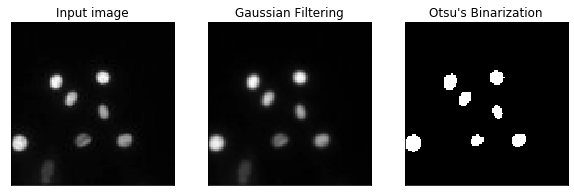

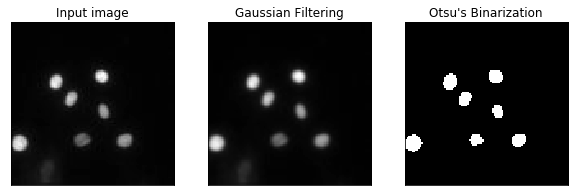

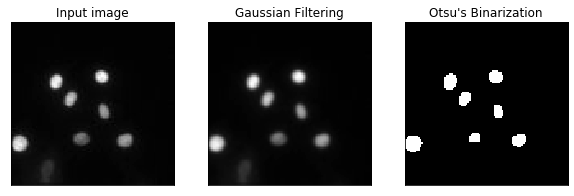

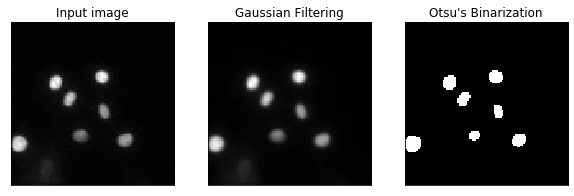

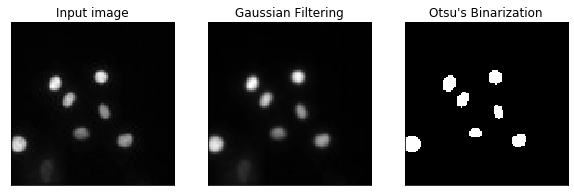

...

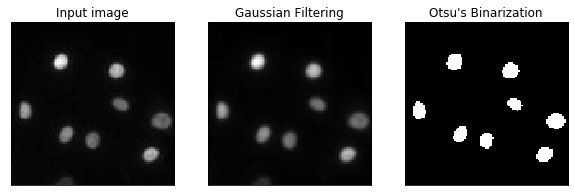

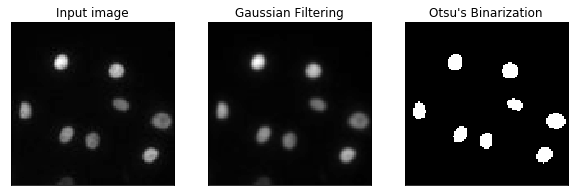

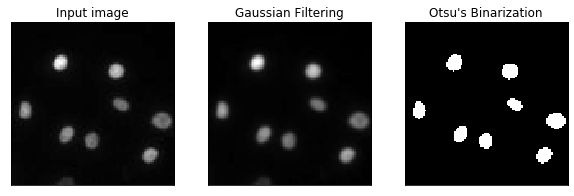

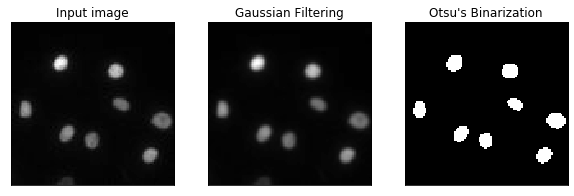

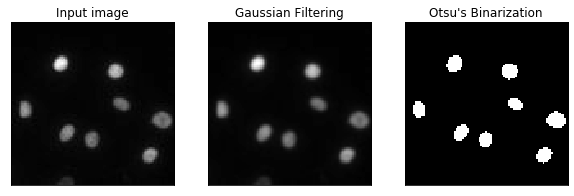

In [41]:
imgs = imgSeries()
imgs.img_analysis(33724)

In [42]:
print("metatdata:", imgs.img_metadata)

metatdata: {'init_zoom': 0, 'tiles': False, 'perms': {'canAnnotate': False, 'canEdit': False, 'canDelete': False, 'canLink': False}, 'rdefs': {'defaultT': 0, 'model': 'greyscale', 'invertAxis': False, 'projection': 'normal', 'defaultZ': 0}, 'pixel_range': [0, 65535], 'interpolate': True, 'channels': [{'coefficient': 1.0, 'active': True, 'window': {'max': 670.0, 'end': 670.0, 'start': 0.0, 'min': 0.0}, 'family': 'linear', 'color': '808080', 'inverted': False, 'reverseIntensity': False, 'emissionWave': None, 'label': 'CFP'}], 'meta': {'projectName': '17-Aoki-MolDyn', 'imageId': 33724, 'imageAuthor': 'public data', 'imageTimestamp': 1342683835.0, 'pixelsType': 'uint16', 'datasetId': 208, 'projectDescription': 'See details in Aoki et al. (2013) Molecular Cell, 52(4): 529-540', 'datasetName': 'sample1', 'wellSampleId': '', 'projectId': 6, 'imageDescription': 'See details in Aoki et al. (2013) Molecular Cell, 52(4): 529-540', 'wellId': '', 'imageName': 'BG-CFP.stk', 'datasetDescription': 'Se

In [43]:
imgs.img_metadata['pixel_range']

[0, 65535]

In [44]:
imgs.num_labels

[8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 9,
 8,
 8,
 8,
 8,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 8,
 11,
 11,
 11,
 9,
 9,
 10,
 9,
 10,
 10,
 11,
 11,
 11,
 12,
 11,
 12,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 11,
 10,
 11,
 11,
 12,
 12,
 11,
 11,
 10,
 10,
 10,
 10,
 10,
 11,
 11,
 10,
 10,
 10,
 11,
 10,
 9,
 9,
 9,
 9,
 9,
 10,
 10,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 10,
 11,
 10,
 12,
 12,
 12,
 12,
 12,
 12,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 10,
 11,
 11,
 11,
 11,
 12,
 11,
 10,
 10,
 11,
 11,
 11,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 11,
 11,
 12,
 12,
 12,
 12,
 11,
 11,
 11,
 11,
 11,
 11,
 12,
 12,
 12,
 12,
 13,
 11,
 11,
 13,
 12,
 11,
 11,
 11,
 11,
 12,
 12,
 12,
 12,
 13,
 11,
 11,
 11,
 11,
 11,
 11,
 

In [45]:
imgs.labels

[array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=int32), array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=int32), array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=int32), array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=int32), array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
 

In [46]:
len(imgs.labels)

391

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


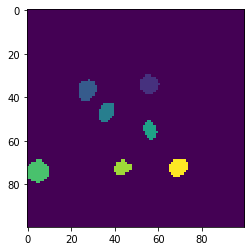

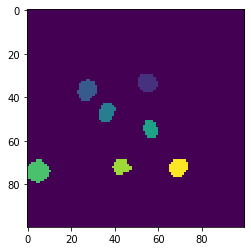

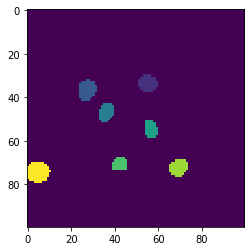

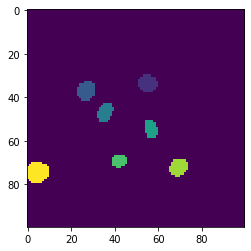

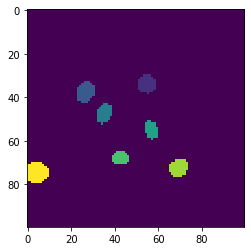

...

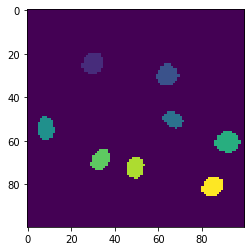

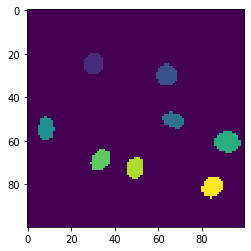

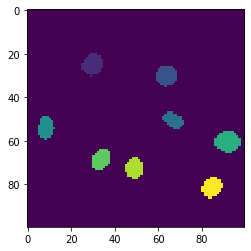

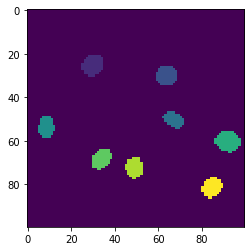

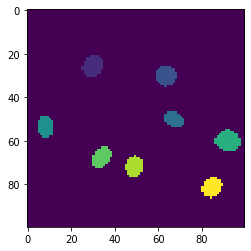

In [47]:
for i in imgs.labels:
  fig, ax = plt.subplots(facecolor="w")
  ax.imshow(i)

In [48]:
len(imgs.centroids)

391

In [49]:
imgs.centroids

[array([[49.95511352, 49.22203708],
        [55.55      , 34.06666667],
        [27.17741935, 36.69354839],
        [36.        , 46.78846154],
        [55.85365854, 54.95121951],
        [ 4.46428571, 73.97619048],
        [43.34146341, 72.26829268],
        [68.94827586, 72.20689655]]), array([[49.97589733, 49.21901085],
        [54.81967213, 33.42622951],
        [27.10606061, 36.66666667],
        [36.14545455, 46.94545455],
        [56.06666667, 54.55555556],
        [ 4.52941176, 73.97647059],
        [42.95555556, 71.93333333],
        [68.96610169, 72.27118644]]), array([[49.97220198, 49.23060906],
        [54.89655172, 33.5862069 ],
        [27.17460317, 36.61904762],
        [35.94117647, 46.8627451 ],
        [56.28571429, 54.5952381 ],
        [42.13157895, 70.73684211],
        [69.03508772, 72.26315789],
        [ 4.51162791, 74.36046512]]), array([[49.96453458, 49.24680187],
        [54.89655172, 33.5862069 ],
        [26.68333333, 36.98333333],
        [35.38461538, 46.

In [50]:
for i in imgs.centroids:
  print("centroids:", i)

centroids: [[49.95511352 49.22203708]
 [55.55       34.06666667]
 [27.17741935 36.69354839]
 [36.         46.78846154]
 [55.85365854 54.95121951]
 [ 4.46428571 73.97619048]
 [43.34146341 72.26829268]
 [68.94827586 72.20689655]]
centroids: [[49.97589733 49.21901085]
 [54.81967213 33.42622951]
 [27.10606061 36.66666667]
 [36.14545455 46.94545455]
 [56.06666667 54.55555556]
 [ 4.52941176 73.97647059]
 [42.95555556 71.93333333]
 [68.96610169 72.27118644]]
centroids: [[49.97220198 49.23060906]
 [54.89655172 33.5862069 ]
 [27.17460317 36.61904762]
 [35.94117647 46.8627451 ]
 [56.28571429 54.5952381 ]
 [42.13157895 70.73684211]
 [69.03508772 72.26315789]
 [ 4.51162791 74.36046512]]
centroids: [[49.96453458 49.24680187]
 [54.89655172 33.5862069 ]
 [26.68333333 36.98333333]
 [35.38461538 46.96153846]
 [56.34146341 54.53658537]
 [41.88235294 69.23529412]
 [69.05357143 72.16071429]
 [ 4.3452381  74.42857143]]
centroids: [[49.97636401 49.22501041]
 [54.50877193 33.78947368]
 [26.44444444 37.555555

In [51]:
len(imgs.areas)

391

In [52]:
for i in imgs.areas:
  print("areas:", i)

areas: [9602, 60, 62, 52, 41, 84, 41, 58]
areas: [9584, 61, 66, 55, 45, 85, 45, 59]
areas: [9605, 58, 63, 51, 42, 38, 57, 86]
areas: [9615, 58, 60, 52, 41, 34, 56, 84]
areas: [9604, 57, 63, 52, 41, 40, 59, 84]
areas: [9610, 57, 61, 55, 41, 39, 58, 79]
areas: [9608, 59, 59, 55, 43, 40, 58, 78]
areas: [9613, 55, 60, 56, 41, 42, 57, 76]
areas: [9608, 57, 61, 55, 42, 42, 59, 76]
areas: [9612, 57, 61, 54, 42, 44, 58, 72]
areas: [9604, 58, 65, 55, 41, 43, 62, 72]
areas: [9605, 57, 64, 56, 43, 41, 63, 71]
areas: [9603, 57, 64, 57, 42, 43, 62, 72]
areas: [9604, 58, 65, 53, 43, 42, 62, 72, 1]
areas: [9615, 57, 64, 54, 42, 40, 60, 68]
areas: [9608, 61, 64, 56, 43, 39, 61, 68]
areas: [9611, 61, 64, 58, 42, 40, 59, 65]
areas: [9616, 62, 64, 56, 41, 42, 57, 62]
areas: [9614, 61, 60, 56, 47, 43, 56, 60, 3]
areas: [9602, 64, 61, 58, 48, 43, 58, 57, 9]
areas: [9607, 60, 61, 57, 49, 40, 57, 59, 10]
areas: [9603, 60, 64, 57, 50, 36, 58, 58, 14]
areas: [9606, 60, 63, 57, 49, 39, 58, 57, 11]
areas: [9605,

In [53]:
#for i in range(imgs.total_timept):
for i in range(len(imgs.areas)):
  print("timept:", i, "num_areas:", len(imgs.areas[i]))
  for k in imgs.areas[i]:
    print("area:", k)

timept: 0 num_areas: 8
area: 9602
area: 60
area: 62
area: 52
area: 41
area: 84
area: 41
area: 58
timept: 1 num_areas: 8
area: 9584
area: 61
area: 66
area: 55
area: 45
area: 85
area: 45
area: 59
timept: 2 num_areas: 8
area: 9605
area: 58
area: 63
area: 51
area: 42
area: 38
area: 57
area: 86
timept: 3 num_areas: 8
area: 9615
area: 58
area: 60
area: 52
area: 41
area: 34
area: 56
area: 84
timept: 4 num_areas: 8
area: 9604
area: 57
area: 63
area: 52
area: 41
area: 40
area: 59
area: 84
timept: 5 num_areas: 8
area: 9610
area: 57
area: 61
area: 55
area: 41
area: 39
area: 58
area: 79
timept: 6 num_areas: 8
area: 9608
area: 59
area: 59
area: 55
area: 43
area: 40
area: 58
area: 78
timept: 7 num_areas: 8
area: 9613
area: 55
area: 60
area: 56
area: 41
area: 42
area: 57
area: 76
timept: 8 num_areas: 8
area: 9608
area: 57
area: 61
area: 55
area: 42
area: 42
area: 59
area: 76
timept: 9 num_areas: 8
area: 9612
area: 57
area: 61
area: 54
area: 42
area: 44
area: 58
area: 72
timept: 10 num_areas: 8
area: 

In [55]:
#for t in range(imgs.total_timept):
for t in range(len(imgs.centroids)):
  print("timept:", t)
  print("No. of labels:", imgs.num_labels[t])
  for i in range(imgs.num_labels[t]):
    print("label:", i, "area:", imgs.areas[t][i], "centroid", imgs.centroids[t][i], "size:", imgs.sizes[t][i], "total_intensity:", imgs.total_intensity_lst[t][i])

timept: 0
No. of labels: 8
label: 0 area: 9602 centroid [49.95511352 49.22203708] size: [100, 100, 'px'] total_intensity: 0.0
label: 1 area: 60 centroid [55.55       34.06666667] size: [9, 9, 'px'] total_intensity: 8408.0
label: 2 area: 62 centroid [27.17741935 36.69354839] size: [8, 10, 'px'] total_intensity: 8659.0
label: 3 area: 52 centroid [36.         46.78846154] size: [7, 9, 'px'] total_intensity: 6249.0
label: 4 area: 41 centroid [55.85365854 54.95121951] size: [7, 9, 'px'] total_intensity: 4337.0
label: 5 area: 84 centroid [ 4.46428571 73.97619048] size: [10, 11, 'px'] total_intensity: 11375.0
label: 6 area: 41 centroid [43.34146341 72.26829268] size: [8, 7, 'px'] total_intensity: 3247.0
label: 7 area: 58 centroid [68.94827586 72.20689655] size: [9, 8, 'px'] total_intensity: 5849.0
timept: 1
No. of labels: 8
label: 0 area: 9584 centroid [49.97589733 49.21901085] size: [100, 100, 'px'] total_intensity: 0.0
label: 1 area: 61 centroid [54.81967213 33.42622951] size: [9, 8, 'px'] 